Huff retail model using mobility patterns analysis in Cambridge
-------------------------------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/MyDrive/Mining_network/

/content/drive/MyDrive/Mining_network


# **Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
import matplotlib.cm as cm
import matplotlib.colors as colors
import contextily as ctx
import geopandas as gpd
import sys

# **Dataset**

### Format of Data

The variables contained in the dataset (which should be self-explanatory), provided in the `Cambridge_gowalla.csv` file, are:

* `User_ID`, or the unique identifier of the user, e.g. 196514
* `check-in-date`, e.g. 2010-07-24
* `check-in-time`, e.g. 13:45:06
* `latitude`, e.g. 53.3648119
* `longitude`, e.g. -2.2723465833
* `loc_id`, or the unique identifier of the location, e.g. 145064

In [ ]:
cambridge= pd.read_csv('Cambridge_gowalla.csv')
cambridge

,ID,User_ID,date,Time,lon,lat,loc_ID
0,1,382,12/09/2010,08:46:10,0.102380,52.173123,1307095
1,2,1050,14/08/2010,07:34:30,0.123451,52.197975,1735486
2,3,1050,14/08/2010,07:31:37,0.122774,52.197910,654162
3,4,1050,13/08/2010,21:07:46,0.116429,52.210057,516769
4,5,1050,13/08/2010,21:07:38,0.116200,52.210010,21381
...,...,...,...,...,...,...,...
1866,1867,192442,14/08/2010,17:34:26,0.127612,52.198955,31328
1867,1868,192840,30/09/2010,10:59:43,0.123349,52.203537,63552
1868,1869,192840,20/09/2010,17:14:46,0.137495,52.194409,21356
1869,1870,194926,10/07/2010,09:56:29,0.121358,52.206970,31256


## Visualise individual check-in locations
Visualise the check-in locations of the GC dataset for users with User ID[75027] and [102829].

---



In [ ]:
cambridge_gdf = gpd.GeoDataFrame(cambridge, geometry=gpd.points_from_xy(cambridge.lon, cambridge.lat))
cambridge_gdf = cambridge_gdf.set_crs(epsg=4326).to_crs(epsg=3857) #To use contextily I will transform the CRS

In [ ]:
users = [75027, 102829]
users_gdf = cambridge_gdf[cambridge_gdf['User_ID'].isin(users)]

In [ ]:
tags = {'shop': ['mall'], #the tags to extract the shopping malls and retail parks in Cambridge
    'landuse': 'retail'}

In [ ]:
#malls_geom will contain the data and geometry of the shopping malls
malls_geom = ox.features_from_address('Purbeck road, Cambridge,UK',tags = tags, dist=4400) #'Purbeck road, Cambridge,UK' and 4400 was selected for aesthetics purposes to plot all the points
malls_geom = malls_geom.dropna(subset=['name'])
malls_geom = malls_geom.to_crs(epsg=3857)

In [ ]:
# all_geom contains all the buildings around the area
all_geom = ox.features_from_address('Purbeck road, Cambridge,UK', tags={"landuse": True}, dist=4400)
all_geom = all_geom.to_crs(epsg=3857)
# The malls extracted previously were removed in this one
all_geom = all_geom[~all_geom.geometry.isin(malls_geom.geometry)]

For better interpretation and to enhance the aesthetics of the maps, a function was created that reclassifies the landuse categories into broader categories.

In [ ]:
def reclassify_landuse(landuse):
  if landuse == 'residential':
    return 'residential'
  elif landuse in ['grass', 'recreation_ground', 'flowerbed', 'meadow', 'forest', 'village_green']:
    return 'green_zone'
  elif landuse in ['college_court', 'university_court']:
    return 'university'
  elif landuse in ['commercial', 'retail']:
    return 'commercial'
  elif landuse in ['farmland', 'allotments', 'greenhouse_horticulture', 'orchard', 'farmyard', 'brownfield']:
    return 'farm'
  else:
    return 'others'

all_geom['reclassified_landuse'] = all_geom['landuse'].apply(reclassify_landuse)

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Below is the map that represents the check-ins for the selected users, with a basemap of the land use categories in the area for estimation of the locations of the users.

<ipython-input-21-40d75c71dfa9>:8: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  malls_geom.plot(column='building', color="red", ax=ax, categorical=True, alpha=0.8)


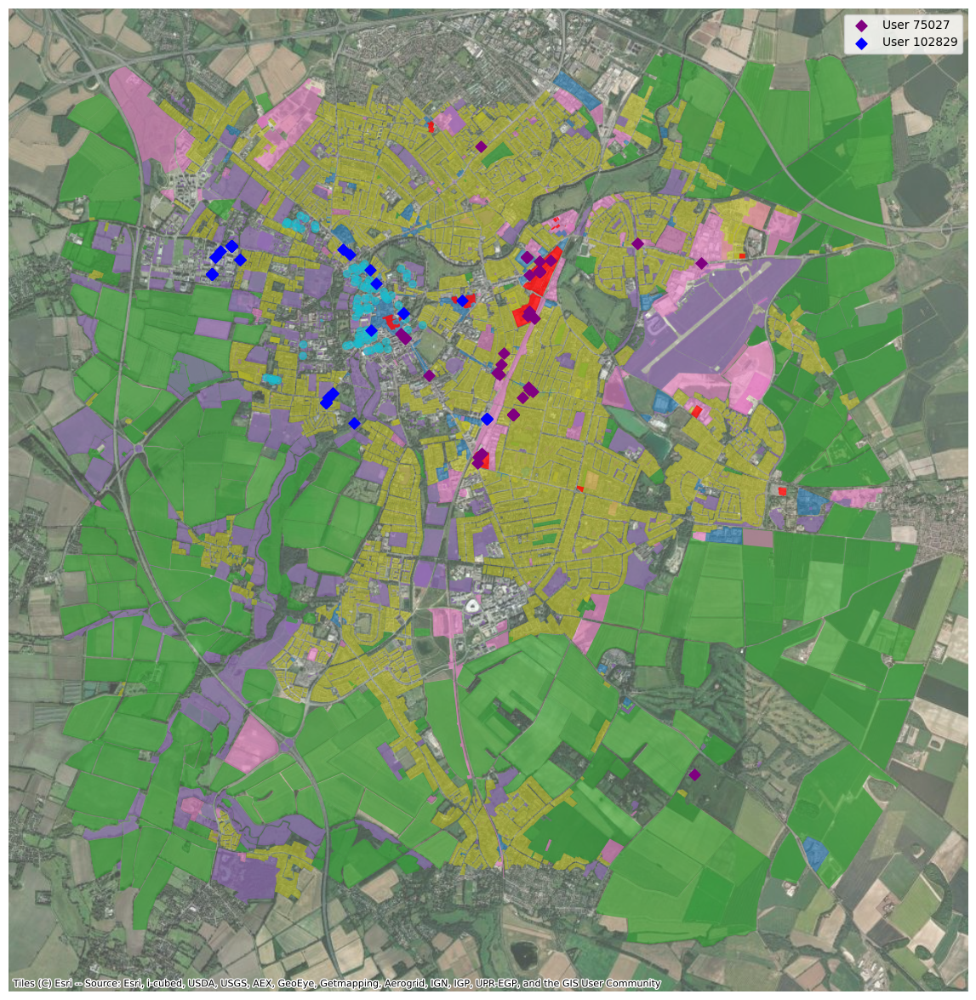

In [ ]:
# the first map is the land cover, the second map is the identified shopping malls
fig, ax = plt.subplots(figsize=(15, 15))
all_geom[all_geom.notna()].plot(column='reclassified_landuse',
                                                             ax=ax,
                                                             categorical=True,
                                                             legend=True,
                                                              alpha=0.6)
malls_geom.plot(column='building', color="red", ax=ax, categorical=True, alpha=0.8)

colors = ['purple', 'blue']  # Colors to highlight the users
for i, user_id in enumerate(users):
    user_df = users_gdf[users_gdf['User_ID'] == user_id]
    ax.scatter(user_df.geometry.x, user_df.geometry.y,
               label=f'User {user_id}', alpha=1, marker="D", s=45 ,
               color=colors[i % len(colors)])


ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery,alpha=0.7)


ax.legend()
plt.axis('off')
# To save the plot as an image
#plt.savefig('cambridge_checkins.png', dpi=300, bbox_inches='tight')

plt.show()

## Provide Characterisation of the Gowalla dataset
---
Provide a characterisation of the mobility data available for the user [75027] on 30/01/2010 and for user [102829] on
24/05/2010, by visualising the shortest paths (on the street network) between each consecutive stop-points for the user using the
OSMnx library.


In [ ]:
#Filter by the dates
user75027_gdf = users_gdf[(users_gdf.date=="30/01/2010") & (users_gdf.User_ID==75027)]
user75027_gdf= user75027_gdf.sort_values('Time') #to order the data from the earliest reported check-in to the latest
user75027_gdf.reset_index(inplace=True,drop=True)
user75027_gdf.head()

,ID,User_ID,date,Time,lon,lat,loc_ID,geometry
0,1228,75027,30/01/2010,15:13:43,0.173005,52.157223,477840,POINT (19258.869 6828603.538)
1,1227,75027,30/01/2010,16:04:04,0.145606,52.204923,31968,POINT (16208.806 6837263.379)
2,1226,75027,30/01/2010,16:06:57,0.144522,52.205200,478133,POINT (16088.08 6837313.635)
3,1225,75027,30/01/2010,16:15:35,0.144826,52.205650,478191,POINT (16121.92 6837395.453)
4,1224,75027,30/01/2010,16:59:45,0.146594,52.209822,373382,POINT (16318.717 6838153.223)


In [ ]:
user102829_gdf = users_gdf[(users_gdf.date=="24/05/2010") & (users_gdf.User_ID==102829)]
user102829_gdf= user102829_gdf.sort_values('Time') #to order the data from the earliest reported check-in to the latest
user102829_gdf.reset_index(inplace=True,drop=True)
user102829_gdf.head()

,ID,User_ID,date,Time,lon,lat,loc_ID,geometry
0,1376,102829,24/05/2010,10:58:54,0.137495,52.194409,21356,POINT (15305.875 6835353.737)
1,1375,102829,24/05/2010,12:14:26,0.090578,52.209531,536286,POINT (10083.078 6838100.444)
2,1374,102829,24/05/2010,14:20:06,0.094001,52.212543,373983,POINT (10464.106 6838647.537)
3,1373,102829,24/05/2010,17:16:12,0.114811,52.194001,1166464,POINT (12780.674 6835279.591)
4,1372,102829,24/05/2010,17:33:12,0.117766,52.203666,21357,POINT (13109.679 6837035.031)


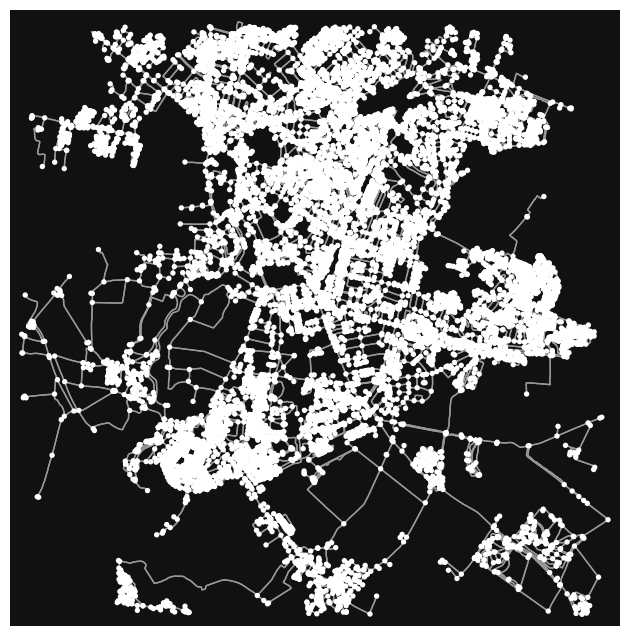

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
cambridge_nx = ox.graph_from_address('Purbeck road, Cambridge,UK', dist=4400, network_type='walk') #same as used when extracting the geometries
ox.plot_graph(cambridge_nx)

The plot contains two subplots to compare the distances on each user side by side.

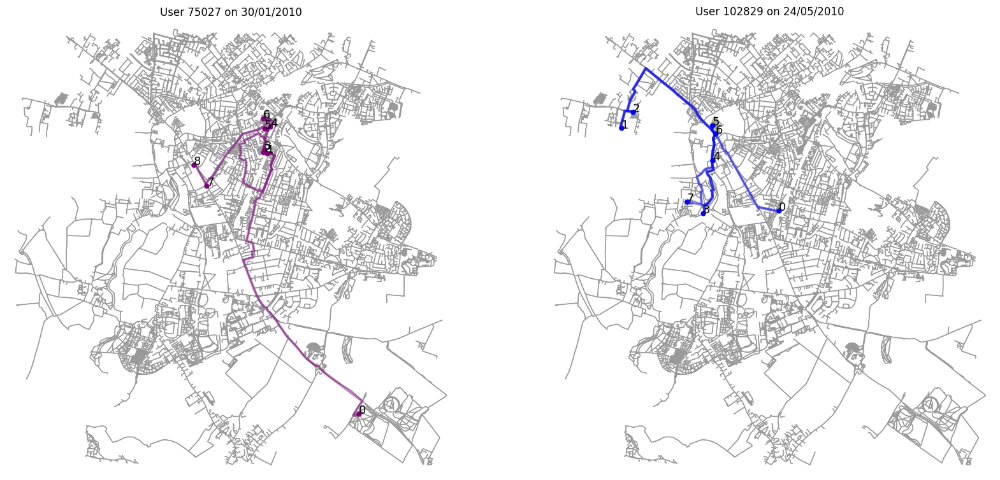

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ox.plot_graph(cambridge_nx, node_size=0, bgcolor='w', ax=ax1, show=False) #first network graph for user 75027
ox.plot_graph(cambridge_nx, node_size=0, bgcolor='w', ax=ax2, show=False) #first network graph for user 102829

# Subplot for User 75027. I adapted the code for week 3 code from the seminars.
for i in range(len(user75027_gdf) - 1):
    origin = (user75027_gdf.iloc[i]['lat'], user75027_gdf.iloc[i]['lon'])
    destination = (user75027_gdf.iloc[i + 1]['lat'], user75027_gdf.iloc[i + 1]['lon'])

    origin_node = ox.distance.nearest_nodes(cambridge_nx, X=origin[1], Y=origin[0])
    destination_node = ox.distance.nearest_nodes(cambridge_nx, X=destination[1], Y=destination[0])

    route = nx.shortest_path(cambridge_nx, origin_node, destination_node, weight='length')
    route_coords = [(cambridge_nx.nodes[node]['y'], cambridge_nx.nodes[node]['x']) for node in route]
    route_lats, route_lons = zip(*route_coords)
    ax1.plot(route_lons, route_lats, linewidth=3, color='purple', alpha=0.5)

#for the label part I used Gemini, the prompt was how to display the index in each node
for idx, row in user75027_gdf.iterrows():
    ax1.scatter(row['lon'], row['lat'], color='purple', s=24)
    ax1.text(row['lon'], row['lat'], str(idx), fontsize=13, color='black')

ax1.set_title("User 75027 on 30/01/2010")

# Subplot for User 102829
for i in range(len(user102829_gdf) - 1):
    origin = (user102829_gdf.iloc[i]['lat'], user102829_gdf.iloc[i]['lon'])
    destination = (user102829_gdf.iloc[i + 1]['lat'], user102829_gdf.iloc[i + 1]['lon'])

    origin_node = ox.distance.nearest_nodes(cambridge_nx, X=origin[1], Y=origin[0])
    destination_node = ox.distance.nearest_nodes(cambridge_nx, X=destination[1], Y=destination[0])

    route = nx.shortest_path(cambridge_nx, origin_node, destination_node, weight='length')
    route_coords = [(cambridge_nx.nodes[node]['y'], cambridge_nx.nodes[node]['x']) for node in route]
    route_lats, route_lons = zip(*route_coords)
    ax2.plot(route_lons, route_lats, linewidth=3, color='blue', alpha=0.5)

for idx, row in user102829_gdf.iterrows():
    ax2.scatter(row['lon'], row['lat'], color='blue', s=24)
    ax2.text(row['lon'], row['lat'], str(idx), fontsize=13, color='black')

ax2.set_title("User 102829 on 24/05/2010")

# to save the plot
#plt.savefig('mobility_map_users.png', dpi=500, bbox_inches='tight')
plt.show()


To calculate the distances statistics, I created a function based on the code from the seminars (week 3) to calculate the shortest path between each consecutive check-in of the users. Then another function to summarize with the maximum, average and total distance.

In [ ]:
# Function to calculate distance between consecutive check-ins
def calculate_distances(user_gdf, graph):
    distances = []  # List to store the distances

    for i in range(len(user_gdf) - 1):
        origin = (user_gdf.iloc[i]['lat'], user_gdf.iloc[i]['lon'])
        destination = (user_gdf.iloc[i + 1]['lat'], user_gdf.iloc[i + 1]['lon'])
        origin_node = ox.distance.nearest_nodes(graph, X=origin[1], Y=origin[0])
        destination_node = ox.distance.nearest_nodes(graph, X=destination[1], Y=destination[0])
        route = nx.shortest_path(graph, origin_node, destination_node, weight='length')
        route_length = nx.shortest_path_length(graph, origin_node, destination_node, weight='length')
        distances.append(route_length)

    return distances

# Function to summarize. I use the Gemini AI to this part. The prompt was "function to calculate maximum and average and display it in a table"
def summarize_mobility_data(distances, user_id, date):
    max_disp = max(distances)
    avg_disp = sum(distances) / len(distances)
    total_dist = sum(distances)

    return {'User ID': user_id,
        'Date': date,
        'Max Displacement (meters)': max_disp,
        'Avg Displacement (meters)': avg_disp,
        'Total Distance Traveled (meters)': total_dist}




In [ ]:
# Applying the distance function for both users
distances_75027 = calculate_distances(user75027_gdf, cambridge_nx)
distances_102829 = calculate_distances(user102829_gdf, cambridge_nx)

In [ ]:
# Applying the summarize function for both users
summary_75027 = summarize_mobility_data(distances_75027, user75027_gdf.iloc[0]['User_ID'], user75027_gdf.iloc[0]['date'])
summary_102829 = summarize_mobility_data(distances_102829, user102829_gdf.iloc[0]['User_ID'], user102829_gdf.iloc[0]['date'])

In [ ]:
# I created a DataFrame for the summary table that joins both results
summary_df = pd.DataFrame([summary_75027, summary_102829])
print(summary_df)

   User ID        Date  Max Displacement (meters)  Avg Displacement (meters)  \
0    75027  30/01/2010                7169.484358                1798.805615   
1   102829  24/05/2010                5590.221262                2223.375639   

   Total Distance Traveled (meters)  
0                      14390.444923  
1                      15563.629471  


## Selecting the best location for a shopping mall


---



For the analysis of the shopping mall location I will use closeness centrality to select two potential location near or on the streets with the highest closeness degree. Then check-in data will be used in the Huff model to compare the probabilities of each location.

First, to reduce computational time, I will assume the best time of demand of a shopping mall is weekends and then I extract the check-in locations on those days and the hours of 9 a.m to 7 p.m assuming the hours of the malls in Cambridge are open in that range of time. The area of analysis is a radius of 2 km from the center of Cambridge in a walk network, which aligns with the Cambridgeshire Active Travel strategy [link text](https://www.cambridgeshire.gov.uk/residents/travel-roads-and-parking/transport-plans-and-policies/cambridgeshires-active-travel-strategy).

In [ ]:
# I convert 'date' column to datetime format
cambridge_gdf['date'] = pd.to_datetime(cambridge_gdf['date'], dayfirst=True, errors='coerce')
cambridge_gdf['day_category'] = cambridge_gdf['date'].dt.dayofweek.apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')


In [ ]:
# This one is to convert 'time' column to datetime time format
cambridge_gdf['Time'] = pd.to_datetime(cambridge_gdf['Time'], format='%H:%M:%S').dt.time

# Then I filter in the time range of opening of shopping malls (9:00 AM to 7:00 PM)
start_time = pd.to_datetime("09:00:00", format="%H:%M:%S").time()
end_time = pd.to_datetime("19:00:00", format="%H:%M:%S").time()

In [ ]:
# Lastky I apply both filters
cambridge_weekend = cambridge_gdf[
    (cambridge_gdf['day_category'] == 'Weekend') &
    (cambridge_gdf['Time'] >= start_time) & (cambridge_gdf['Time'] <= end_time)]
cambridge_weekend

,ID,User_ID,date,Time,lon,lat,loc_ID,geometry,day_category
6,7,1773,2010-03-28,16:00:00,0.139358,52.202560,290570,POINT (15513.309 6836834.108),Weekend
7,8,1773,2010-03-28,12:16:40,0.121455,52.204039,52575,POINT (13520.294 6837102.777),Weekend
8,9,1773,2010-03-28,12:07:13,0.117668,52.205006,311333,POINT (13098.798 6837278.318),Weekend
10,11,1876,2010-08-22,10:58:08,0.124832,52.202225,317567,POINT (13896.186 6836773.277),Weekend
11,12,1876,2010-08-22,10:35:51,0.133270,52.206797,34550,POINT (14835.563 6837603.743),Weekend
...,...,...,...,...,...,...,...,...,...
1863,1864,190023,2010-06-05,14:50:19,0.134727,52.189148,116146,POINT (14997.794 6834398.352),Weekend
1864,1865,190023,2010-06-05,14:50:07,0.143693,52.178797,629890,POINT (15995.835 6832519.074),Weekend
1865,1866,190023,2010-06-05,14:49:56,0.131539,52.181021,698298,POINT (14642.843 6832922.701),Weekend
1866,1867,192442,2010-08-14,17:34:26,0.127612,52.198955,31328,POINT (14205.747 6836179.299),Weekend


In [ ]:
#For this part I used Gemini AI. The prompt was "how to create a filter rows that are located in a radius of 2km from the center of Cambridge"

from shapely.geometry import Point

cambridge_center_point = Point(0.119167, 52.205276)
cambridge_center = gpd.GeoSeries([cambridge_center_point], crs="EPSG:4326").to_crs(epsg=3857).geometry[0]
buffer_2km = cambridge_center.buffer(2000)

cambridge_weekend = cambridge_weekend[cambridge_weekend.geometry.within(buffer_2km)]


## Closeness centrality

Closeness centrality measures the average shortest distance between each node in a network. Nodes with high closeness centrality are important because they can easily connect to other nodes throughout the network and in the case of retail, shopping malls and convenience stores value locations with better closeness as found in some case studies in China, Lin, G., et al. (2018). "The location of retail stores and street centrality in Guangzhou, China." [link text](https://www.sciencedirect.com/science/article/pii/S0143622817304332?via%3Dihub), Liu, Y., et al. (2016). "Relationships between Street Centrality and Land Use Intensity in Wuhan, China. [link text](https://https://ascelibrary.org/doi/10.1061/%28ASCE%29UP.1943-5444.0000274)"

In [ ]:
cambridge_nx = ox.graph_from_point((cambridge_center_point.y, cambridge_center_point.x), dist=2000, network_type='walk') #from the center point in the previous line of code in order to preserve coherence in the study area

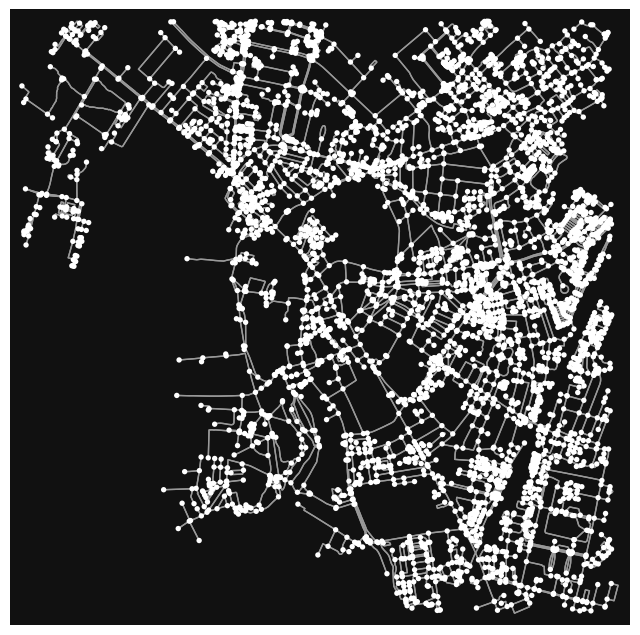

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
ox.plot_graph(cambridge_nx)

Adapted from the code form the seminars, I estimated the closeness degree centrality for the edges of the network

In [ ]:
edge_cc = nx.closeness_centrality(nx.line_graph(cambridge_nx))
nx.set_edge_attributes(cambridge_nx,edge_cc,'cc')

In [ ]:
cambridge_edges = ox.graph_to_gdfs(cambridge_nx,nodes=False,fill_edge_geometry=True)
cambridge_edges = cambridge_edges.to_crs(epsg=3857)

In [ ]:
tags = {'shop': ['mall'],
    'landuse': 'retail'}

In [ ]:
malls_geom = ox.features_from_address("Cambridge,UK", tags=tags, dist=2000) #since the study area will be 2 km, mall_geom (shopping malls polygons) was calculated again
malls_geom = malls_geom.dropna(subset=['name'])
malls_geom = malls_geom.to_crs(epsg=3857)

In [ ]:
all_geom = ox.features_from_address("Cambridge, UK", tags={"landuse": True}, dist=2000) #since the study area will be 2 km, all_geom (all buildings except shopping malls) was calculated again
all_geom = all_geom.to_crs(epsg=3857)
all_geom = all_geom[~all_geom.geometry.isin(malls_geom.geometry)]
all_geom['reclassified_landuse'] = all_geom['landuse'].apply(reclassify_landuse)

<ipython-input-41-a3f5f56b8ebe>:16: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  malls_geom.plot(column='building',
<ipython-input-41-a3f5f56b8ebe>:25: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize=5, handlelength=0.5)


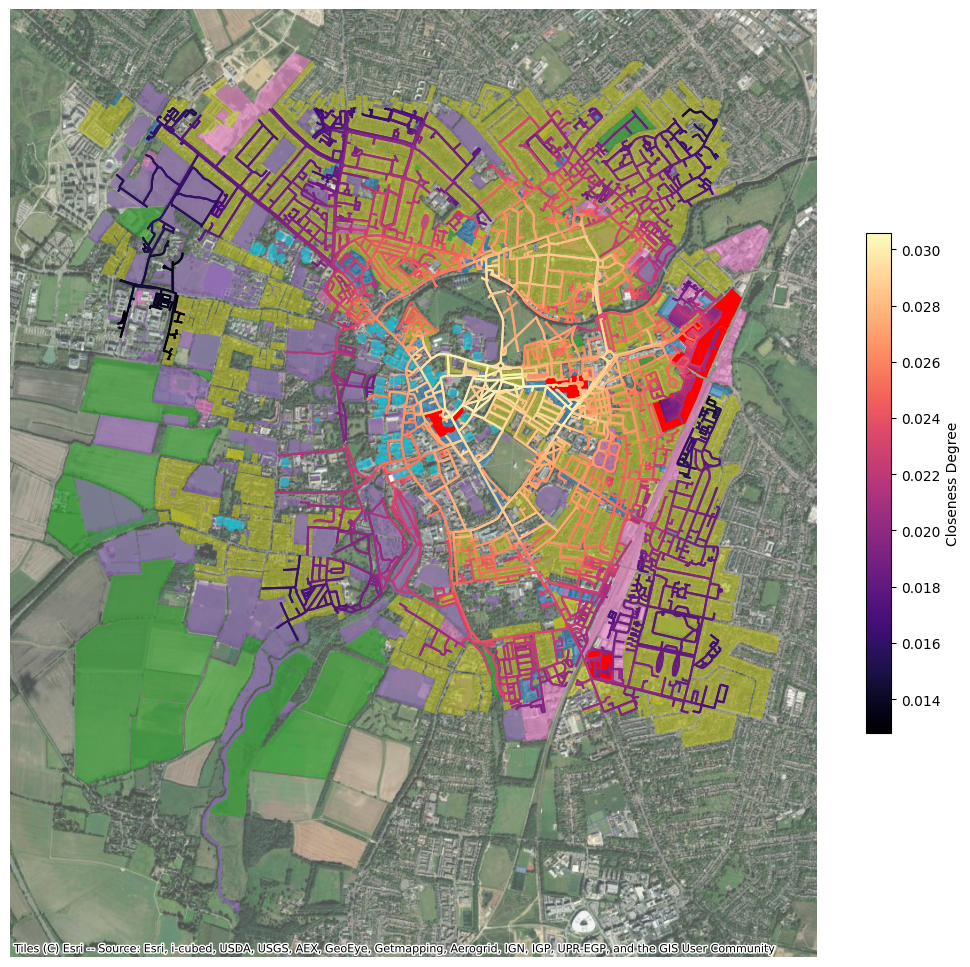

In [ ]:
# closeness map

fig, ax = plt.subplots(figsize=(13, 13))
#layer for the closeness degree
cambridge_edges.plot('cc',cmap='magma',ax=ax, legend=True, alpha=1,
                     legend_kwds={'shrink': 0.5, 'pad': 0.05,'label': 'Closeness Degree'})

# Layer for the land use (rest of the buildings)
all_geom[all_geom.notna()].plot(column='reclassified_landuse',
                                                             ax=ax,
                                                             categorical=True,
                                                             legend=True,
                                                              alpha=0.6)

# Layer for the shopping malls
malls_geom.plot(column='building',
                                                             ax=ax,
                                                             categorical=True,
                                                             legend=True,
                                                              alpha=1, color="red")



ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery,alpha=0.7)
ax.legend(loc="upper right", fontsize=5, handlelength=0.5)
ax.set_axis_off()
# Save the plot as an PNG file
#plt.savefig('cambridge_closeness_centrality.png', dpi=300, bbox_inches='tight')
plt.show()

Base on the closeness maps, I selected two possible coordinates for shopping malls according to the highest closeness centrality and land use (residential or commercial). The following code creates two hypothetical polygons with a size of 20.000 squared meters.

In [ ]:
#For this part I used Gemini AI, the prompt was "how to create polygons with these coordinates and with a specific size
from shapely.geometry import Point, box
import pyproj
from pyproj import Transformer


coords = [(52.200179, 0.126991), (52.206402, 0.128661)]  # (lat, lon) pairs
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)

# Size of the shopping malls
side_length = 20000 ** 0.5
half_side = side_length / 2

polygons = []
for lat, lon in coords:
    x, y = transformer.transform(lon, lat)
    polygon = box(x - half_side, y - half_side, x + half_side, y + half_side)
    polygons.append(polygon)

# Convert to geoDataFrame
new_polygons = gpd.GeoDataFrame(
    {"geometry": polygons, "landuse": ["hypothetical_mall_1", "hypothetical_mall_2"]},
    crs="EPSG:3857")

# Append to malls_geom
malls_geom = gpd.GeoDataFrame(pd.concat([malls_geom, new_polygons], ignore_index=True))


<ipython-input-43-0424acabcc7f>:16: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  malls_geom.plot(column='building',
<ipython-input-43-0424acabcc7f>:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize=5, handlelength=0.5)


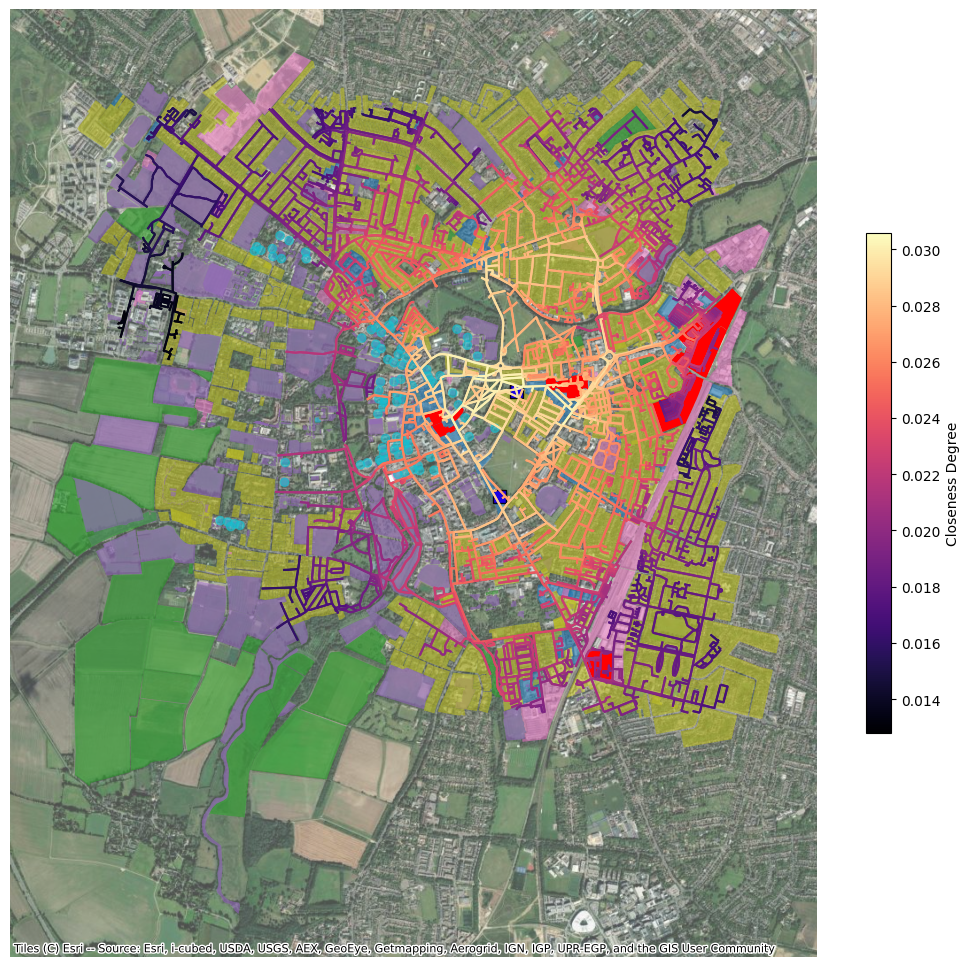

In [ ]:
# closeness map

fig, ax = plt.subplots(figsize=(13, 13))
#layer for the closeness degree
cambridge_edges.plot('cc',cmap='magma',ax=ax, legend=True, alpha=1,
                     legend_kwds={'shrink': 0.5, 'pad': 0.05,'label': 'Closeness Degree'})

# Layer for the land use (rest of the buildings)
all_geom[all_geom.notna()].plot(column='reclassified_landuse',
                                                             ax=ax,
                                                             categorical=True,
                                                             legend=True,
                                                              alpha=0.6)

# Layer for the shopping malls
malls_geom.plot(column='building',
                                                             ax=ax,
                                                             categorical=True,
                                                             legend=True,
                                                              alpha=1, color="red")
# To plot new polygons (hypothetical malls) in blue
malls_geom[malls_geom.landuse.isin(["hypothetical_mall_1", "hypothetical_mall_2"])].plot(
    ax=ax, color="blue", alpha=0.9, edgecolor="black")


ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery,alpha=0.7)
ax.legend(loc="upper right", fontsize=5, handlelength=0.5)
ax.set_axis_off()
# Save the plot as an PNG file
plt.savefig('cambridge_closeness_centrality_new.png', dpi=300, bbox_inches='tight')
plt.show()

Once the potential locations are selected, the next part of the code will focus on the Huff model.

The Huff model estimates the probability that a consumer at location *i* will choose mall *j* and is given by:

$$
P_{ij} = \frac{A_j^\alpha \cdot D_{ij}^{-\beta}}{\sum_{j=1}^n A_k^\alpha \cdot D_{ij}^{-\beta}}
$$

where:
- \( P_{ij} \) is the probability that a consumer at location \( i \) chooses mall \( j \),
- \( A_j \) is the attractiveness of mall \( j \) (e.g., mall size),
- \( D_{ij} \) is the distance between location \( i \) and mall \( j \),
- \( \alpha \) and \( \beta \) are parameters reflecting sensitivity to attractiveness and distance, respectively.

For this analysis:
- \( \alpha = 1 \),
- \( \beta = 2 \),
consistent with traditional assumptions in Huff model applications.

The assumed size for both mall locations was **20,000 square meters**.


 First, the check-in dataset will include a column about the nearest node to each check-in to calculate the distance from the centroid of the shopping mall to each check-in. The shopping malls dataset will include the size, the centroid and nearest node.

With the above information, the Huff model will be estimated for each scenario representing one of the potential locations and taking into account the existing shopping malls.First, I computed the nearest nodes of the check-ins and the centroids of the shopping malls in order to calculate the shortest walking distance of each check-in to each mall and that will serve as the cost parameter of the Huff model.

In [ ]:
#Empty list to store the nearest nodes
checkin_nodes = []
cambridge_weekend.to_crs(epsg=4326)

# Iterate over each check-in in cambridge_weekend (filtered database of check-ins during weekends from 9 am to 7 pm)
for _, row in cambridge_weekend.iterrows():
    nearest_node = ox.distance.nearest_nodes(cambridge_nx, X=row["lon"], Y=row["lat"])
    checkin_nodes.append(nearest_node)

# Assigning the list to a new column of the database
cambridge_weekend["checkin_node"] = checkin_nodes
cambridge_weekend = cambridge_weekend.to_crs(epsg=3857)
cambridge_weekend

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,ID,User_ID,date,Time,lon,lat,loc_ID,geometry,day_category,checkin_node
7,8,1773,2010-03-28,12:16:40,0.121455,52.204039,52575,POINT (13520.294 6837102.777),Weekend,503185817
8,9,1773,2010-03-28,12:07:13,0.117668,52.205006,311333,POINT (13098.798 6837278.318),Weekend,20921956
10,11,1876,2010-08-22,10:58:08,0.124832,52.202225,317567,POINT (13896.186 6836773.277),Weekend,20823587
11,12,1876,2010-08-22,10:35:51,0.133270,52.206797,34550,POINT (14835.563 6837603.743),Weekend,1120095650
21,22,3969,2010-07-17,17:31:33,0.126856,52.199998,365559,POINT (14121.503 6836368.792),Weekend,1504385331
...,...,...,...,...,...,...,...,...,...,...
1840,1841,190023,2010-06-05,15:00:53,0.129994,52.196684,926774,POINT (14470.821 6835766.908),Weekend,6572082
1841,1842,190023,2010-06-05,15:00:40,0.129051,52.197523,31332,POINT (14365.88 6835919.167),Weekend,21390891
1842,1843,190023,2010-06-05,15:00:24,0.129975,52.196803,545255,POINT (14468.699 6835788.545),Weekend,21390892
1866,1867,192442,2010-08-14,17:34:26,0.127612,52.198955,31328,POINT (14205.747 6836179.299),Weekend,609064


In [ ]:
malls_geom = malls_geom.to_crs(epsg=4326)

# Centroid coordinates of the shopping malls (existing and potential)
malls_geom["centroid"] = malls_geom.geometry.centroid
malls_geom["lon"] = malls_geom["centroid"].x
malls_geom["lat"] = malls_geom["centroid"].y

# Nearest node for each centroid
malls_geom["nearest_node"] = malls_geom.apply(
    lambda row: ox.distance.nearest_nodes(cambridge_nx, X=row["lon"], Y=row["lat"]), axis=1
)
malls_geom = malls_geom.to_crs(epsg=3857)

<ipython-input-45-c947e8ec35d1>:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  malls_geom["centroid"] = malls_geom.geometry.centroid


Next, the size of the malls that will serve as an atractiveness parameter of the Huff model.

In [ ]:
malls_geom["mall_size"] = malls_geom.geometry.area  # Area in square meters

**Huff model function**
For the function, I created based on this process but adapting it to python funciton https://gisgeography.com/huff-gravity-model/

In [ ]:
import pandas as pd
import networkx as nx

def calculate_huff_multiple(new_mall, existing_malls, checkins, network):
    for new_mall_index in new_mall:
      # Excluding the other new mall from the calculation in order to evaluate the huff model without taking into account the other potential location
        exclude_malls = [mall for mall in new_mall if mall != new_mall_index]
        filtered_existing_malls = existing_malls.drop(index=exclude_malls)

        # Cost parameter (Distance calculation)
        #Distance to existing malls
        distances_new_mall = []
        distances_existing_malls = {}
        for i, mall in filtered_existing_malls.iterrows():
            distances = []
            for _, checkin in checkins.iterrows():
                distance = nx.shortest_path_length(
                    network,
                    checkin["checkin_node"],
                    mall["nearest_node"],
                    weight="length"
                )
                distances.append(distance)
            distances_existing_malls[i] = distances

        # Distance to new mall
        selected_new_mall = existing_malls.loc[new_mall_index]
        for _, checkin in checkins.iterrows():
            distance = nx.shortest_path_length(
                network,
                checkin["checkin_node"],
                selected_new_mall["nearest_node"],
                weight="length"
            )
            distances_new_mall.append(distance)

        # Attractiveness score (mall size/distance**2)
        attractiveness_existing_malls = {}
        for i, mall in filtered_existing_malls.iterrows():
            distances = distances_existing_malls[i]
            mall_size = mall["mall_size"]
            attractiveness_existing_malls[i] = [
                mall_size / (d ** 2) if d > 0 else mall_size / (0.01 ** 2)
                for d in distances
            ]

        # Attractiveness score for the new mall
        attractiveness_new_mall = [
            selected_new_mall["mall_size"] / (d ** 2) if d > 0 else selected_new_mall["mall_size"] / (0.01 ** 2)
            for d in distances_new_mall
        ]

        # Total attractiveness
        total_attractiveness = [
            sum([attractiveness_existing_malls[i][j] for i in filtered_existing_malls.index])
            + attractiveness_new_mall[j]
            for j in range(len(distances_new_mall))
        ]

        # Market share (Huff model score) for the new mall
        market_share = [
            attractiveness_new_mall[j] / total_attractiveness[j]
            if total_attractiveness[j] > 0 else 0
            for j in range(len(distances_new_mall))
        ]

        # Adding the market share column to the database
        checkins[f"marketshare_{new_mall_index}"] = market_share

    return checkins


In [ ]:
new_malls = [8, 9] #indes of the potential locations
cambridge_weekend = calculate_huff_multiple(new_malls, malls_geom, cambridge_weekend, cambridge_nx) #application of the function

In [ ]:
cambridge_weekend.head()

,ID,User_ID,date,Time,lon,lat,loc_ID,geometry,day_category,checkin_node,marketshare_8,marketshare_9
7,8,1773,2010-03-28,12:16:40,0.121455,52.204039,52575,POINT (13520.294 6837102.777),Weekend,503185817,1.400026e-10,1.878593e-10
8,9,1773,2010-03-28,12:07:13,0.117668,52.205006,311333,POINT (13098.798 6837278.318),Weekend,20921956,2.675223e-02,5.262309e-02
10,11,1876,2010-08-22,10:58:08,0.124832,52.202225,317567,POINT (13896.186 6836773.277),Weekend,20823587,1.064669e-01,8.254011e-02
11,12,1876,2010-08-22,10:35:51,0.133270,52.206797,34550,POINT (14835.563 6837603.743),Weekend,1120095650,9.787706e-04,1.260627e-02
21,22,3969,2010-07-17,17:31:33,0.126856,52.199998,365559,POINT (14121.503 6836368.792),Weekend,1504385331,5.000000e-01,5.703390e-02


**Plotting the Huff model results**

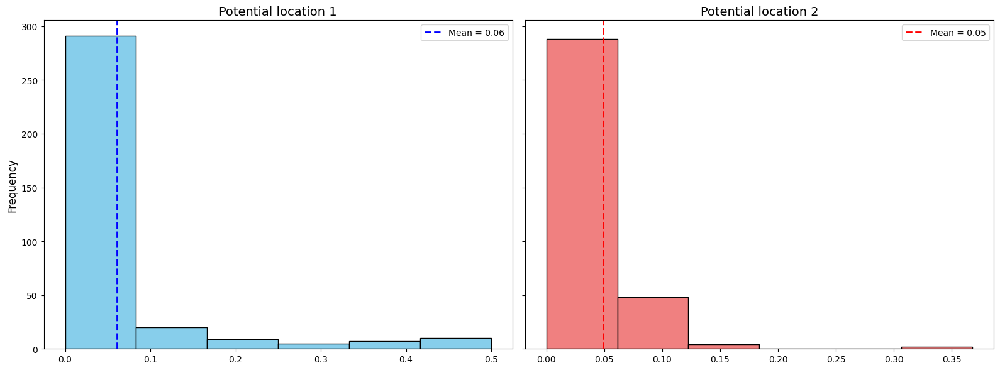

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# First location
mean_1 = cambridge_weekend['marketshare_8'].mean()
ax1.hist(cambridge_weekend['marketshare_8'], bins=6, color='skyblue', edgecolor='black')
ax1.axvline(mean_1, color='blue', linestyle='dashed', linewidth=2, label=f'Mean = {mean_1:.2f}')
ax1.set_title('Potential location 1', fontsize=14)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.legend()

# Second location
mean_2 = cambridge_weekend['marketshare_9'].mean()
ax2.hist(cambridge_weekend['marketshare_9'], bins=6, color='lightcoral', edgecolor='black')
ax2.axvline(mean_2, color='red', linestyle='dashed', linewidth=2, label=f'Mean = {mean_2:.2f}')
ax2.set_title('Potential location 2', fontsize=14)
ax2.legend()

plt.tight_layout()
fig.savefig("histograms.png", format="png")
plt.show()


To plot the results a contour polygons to categorize the data will be used. The data will be categorized from 0 to 50% by groups of 10% in order to compare which location capture the most points with high market probability.

In [ ]:
#For the function to create the contour polygons that categorize the points by zones
#I use Gemini AI. The prompt was "how to create contour polygons that encapsules the points by categories according to a value based on a column"
from scipy.interpolate import griddata
from shapely.geometry import Polygon


def generate_contours(x, y, z, levels, crs):
    grid_x, grid_y = np.mgrid[
        x.min():x.max():300j,
        y.min():y.max():300j
    ]
    grid_z = griddata((x, y), z, (grid_x, grid_y), method='linear')
    grid_z = np.nan_to_num(grid_z, nan=0.0)

    fig, ax = plt.subplots()
    cs = ax.contourf(grid_x, grid_y, grid_z, levels=levels)
    plt.close(fig)

    polygons = []
    labels = []
    values = []

    for i in range(len(levels) - 1):
        if i < len(cs.allsegs) and cs.allsegs[i]:
            for seg in cs.allsegs[i]:
                try:
                    poly = Polygon(seg)
                    if poly.is_valid:
                        polygons.append(poly)
                        labels.append(f"{levels[i]} - {levels[i + 1]}")
                        values.append((levels[i] + levels[i + 1]) / 2)
                except Exception:
                    continue

    return gpd.GeoDataFrame({
        'range': labels,
        'value': values,
        'geometry': polygons
    }, crs=crs)


In [ ]:
levels = [0, 0.1, 0.2, 0.3, 0.4] #categories of market probabilities according to the histograms
crs = cambridge_weekend.crs #check-in crs

# Data for potential location 1
x8 = cambridge_weekend.geometry.x.values
y8 = cambridge_weekend.geometry.y.values
z8 = cambridge_weekend['marketshare_8'].values
contour_gdf_8 = generate_contours(x8, y8, z8, levels, crs)

# Data for potential location 2
z9 = cambridge_weekend['marketshare_9'].values
contour_gdf_9 = generate_contours(x8, y8, z9, levels, crs)  # x and y are same

# Filter potential locations
mall_1 = malls_geom[malls_geom.landuse == "hypothetical_mall_1"]
mall_2 = malls_geom[malls_geom.landuse == "hypothetical_mall_2"]

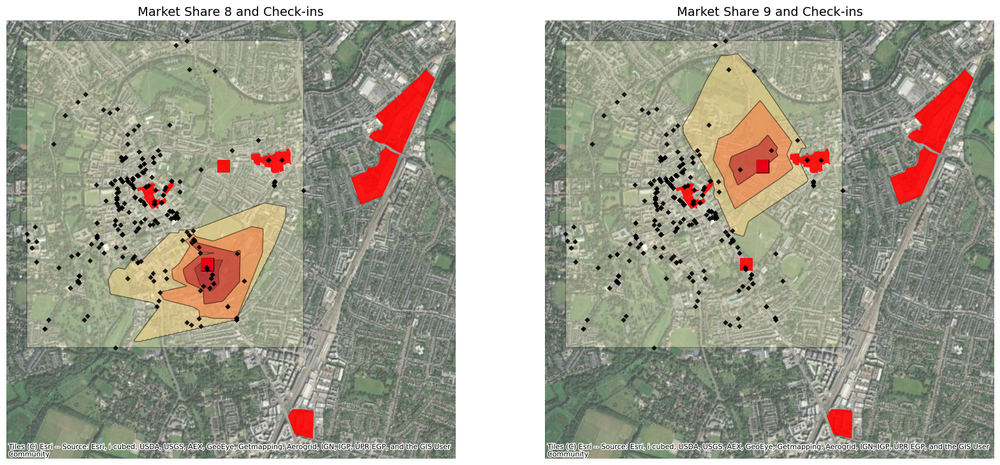

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plot for potential location 1
contour_gdf_8.plot(ax=ax1, column='value', cmap='YlOrRd', edgecolor='black', alpha=0.3, legend=False)
mall_1.plot(ax=ax1, color="blue", edgecolor="black", label="hypothetical_mall_1")
malls_geom.plot(ax=ax1, color="red", alpha=0.9)
ax1.scatter(x8, y8, color='black', marker='D', s=16, alpha=0.9, edgecolor='k', linewidth=0.2)
ctx.add_basemap(ax1, source=ctx.providers.Esri.WorldImagery, alpha=0.7)
ax1.set_title("Market Share 8 and Check-ins", fontsize=14)
ax1.axis("off")

# Plot for potential location 2
contour_gdf_9.plot(ax=ax2, column='value', cmap='YlOrRd', edgecolor='black', alpha=0.3, legend=False)
mall_2.plot(ax=ax2, color="blue", edgecolor="black", label="hypothetical_mall_2")
malls_geom.plot(ax=ax2, color="red", alpha=0.9)
ax2.scatter(x8, y8, color='black', marker='D', s=16, alpha=0.9, edgecolor='k', linewidth=0.2)
ctx.add_basemap(ax2, source=ctx.providers.Esri.WorldImagery, alpha=0.7)
ax2.set_title("Market Share 9 and Check-ins", fontsize=14)
ax2.axis("off")

#fig.savefig("marketshare_8_9_map.svg", format="svg", bbox_inches="tight")
plt.show()